In [1]:
!pip install ipython-autotime
%load_ext autotime

time: 2.51 ms (started: 2021-06-28 14:54:20 +00:00)


In [2]:
#DATA GATHERING- stored in gdrive

time: 739 µs (started: 2021-06-28 14:54:20 +00:00)


In [3]:
#PREPROCESSING
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from skimage.io import imread
from skimage.transform import resize

time: 396 ms (started: 2021-06-28 14:54:20 +00:00)


In [4]:
target = []
images = []
flat_data = []

DATADIR ='/content/drive/MyDrive/Images'
CATEGORIES = ['RED_APPLE','BANANA','GRAPES']

for i in CATEGORIES:
  print(i)

RED_APPLE
BANANA
GRAPES
time: 3.17 ms (started: 2021-06-28 14:54:39 +00:00)


/content/drive/MyDrive/Images/RED_APPLE


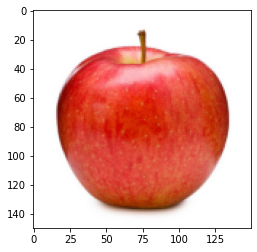

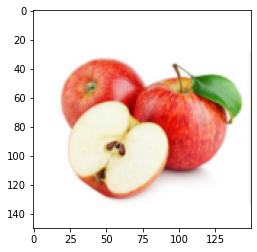

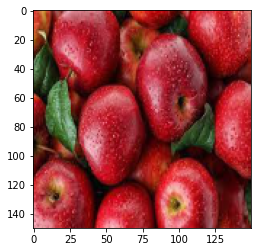

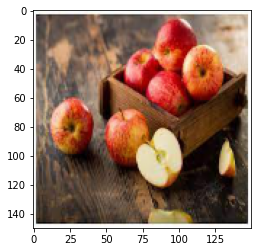

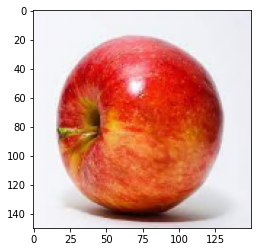

...

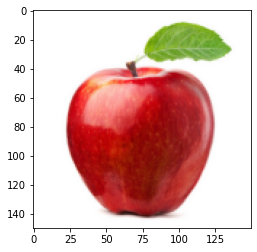

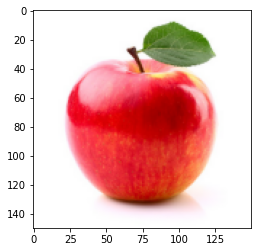

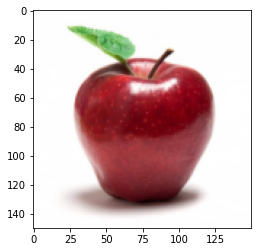

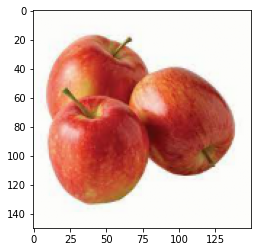

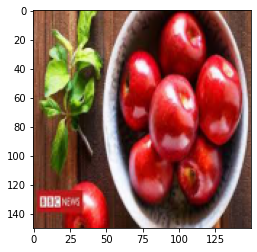

/content/drive/MyDrive/Images/BANANA


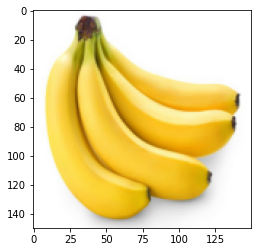

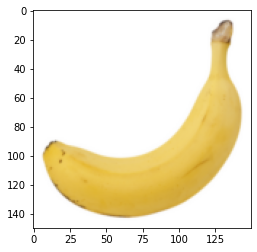

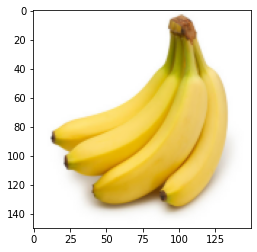

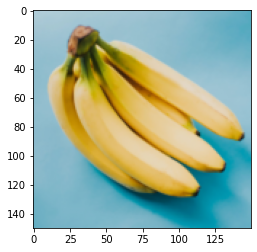

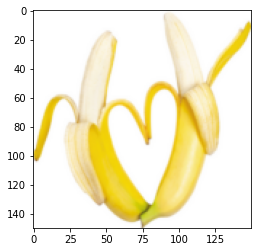

...

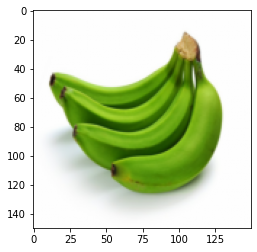

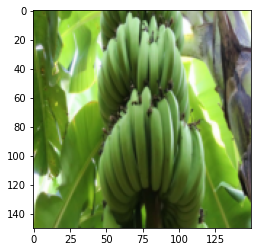

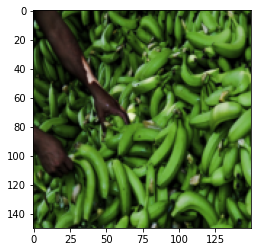

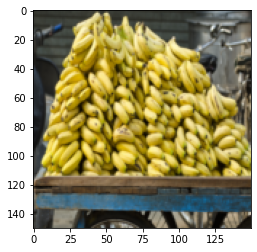

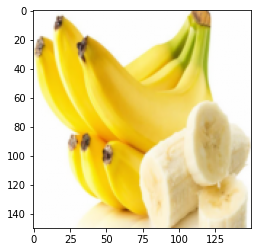

/content/drive/MyDrive/Images/GRAPES


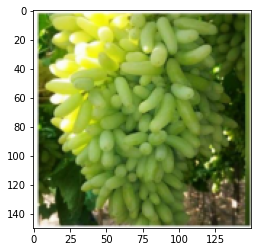

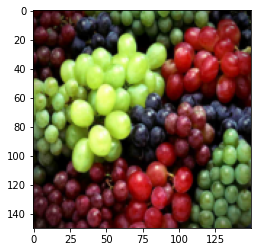

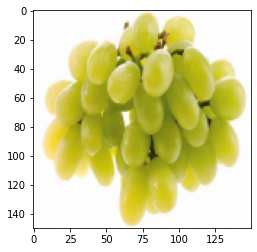

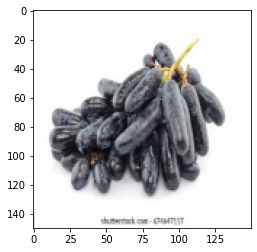

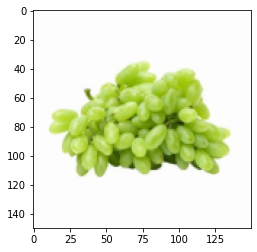

...

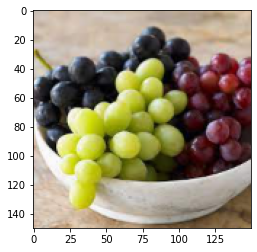

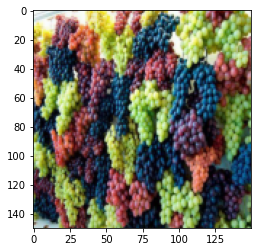

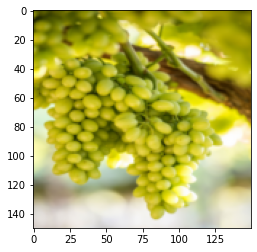

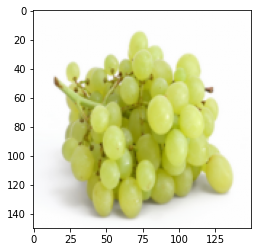

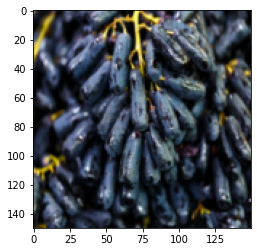

time: 41.2 s (started: 2021-06-28 14:54:42 +00:00)


In [5]:
#numbering the categories
for i in CATEGORIES:
  class_num = CATEGORIES.index(i)
  path = os.path.join(DATADIR,i)
  print(path)

  for img in os.listdir(path):
    img_array = imread(os.path.join(path,img))

    #resizing the images-> flatten->store
    img_resized = resize(img_array,(150,150,3))
    flat_data.append(img_resized.flatten())
    images.append(img_resized)
    target.append(class_num)

    plt.imshow(img_resized)
    plt.show()


In [6]:
#Converting into numpy array
flat_data = np.array(flat_data)
target = np.array(target)
images = np.array(images)

time: 34.6 ms (started: 2021-06-28 14:55:31 +00:00)


[0 1 2] [35 35 35]


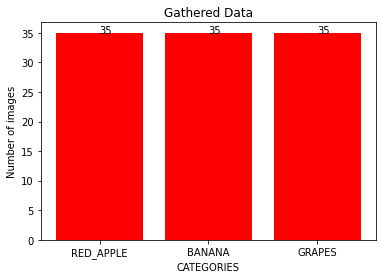

time: 159 ms (started: 2021-06-28 14:55:34 +00:00)


In [7]:
unique,count = np.unique(target, return_counts=True)
print(unique,count)
x = CATEGORIES
y = count
plt.bar(x,y,color='r')

plt.title('Gathered Data')
plt.xlabel('CATEGORIES')
plt.ylabel('Number of images')
for i in range(len(x)):
  plt.text(i,y[i],y[i])

In [8]:
#spliting data
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(flat_data,target,test_size = 0.3,random_state=0)

time: 175 ms (started: 2021-06-28 14:55:36 +00:00)


In [9]:
from sklearn.svm import SVC
model = SVC()
model.fit(x_train,y_train)
y_pred = model.predict(x_test)


time: 1.13 s (started: 2021-06-28 14:55:39 +00:00)


In [10]:
from sklearn.metrics import accuracy_score,classification_report
accuracy_score(y_pred,y_test)

0.46875

time: 5.47 ms (started: 2021-06-28 14:55:44 +00:00)


In [11]:
#GRID-SEARCH CV

from sklearn.model_selection import GridSearchCV
from sklearn import svm
param_grid = {'C':[0.1,1,10,100,1000],
           'gamma': [1,0.1,0.01,0.001,0.0001],
           'kernel': ['rbf','linear','poly']}

grid = GridSearchCV(SVC(),param_grid)

grid.fit(x_train,y_train)

GridSearchCV(cv=None, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf', 'linear', 'poly']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

time: 3min 50s (started: 2021-06-28 14:55:47 +00:00)


In [12]:
y_pred2 = grid.predict(x_test)
y_pred2

array([0, 1, 0, 2, 2, 1, 0, 0, 1, 1, 2, 2, 1, 0, 0, 0, 0, 1, 0, 0, 1, 2,
       1, 2, 1, 2, 0, 0, 1, 2, 1, 2])

time: 233 ms (started: 2021-06-28 14:59:37 +00:00)


In [13]:
y_test

array([0, 1, 0, 1, 2, 1, 0, 2, 1, 1, 1, 2, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 2, 2, 2, 0, 2, 2, 2, 1, 2])

time: 4.49 ms (started: 2021-06-28 14:59:38 +00:00)


In [14]:
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report
print(accuracy_score(y_pred2,y_test))
print("Confusion Matrix:\n",confusion_matrix(y_pred2,y_test))
print(classification_report(y_pred2,y_test))

0.71875
Confusion Matrix:
 [[10  0  2]
 [ 2  7  2]
 [ 0  3  6]]
              precision    recall  f1-score   support

           0       0.83      0.83      0.83        12
           1       0.70      0.64      0.67        11
           2       0.60      0.67      0.63         9

    accuracy                           0.72        32
   macro avg       0.71      0.71      0.71        32
weighted avg       0.72      0.72      0.72        32

time: 13.5 ms (started: 2021-06-28 14:59:38 +00:00)


In [15]:
#Checking working

time: 1.17 ms (started: 2021-06-28 14:59:38 +00:00)


(225, 225, 3)
Predicted Output : RED_APPLE


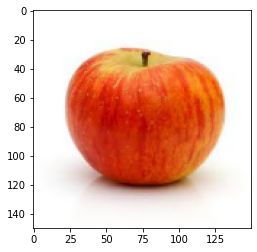

(280, 240, 3)
Predicted Output : RED_APPLE


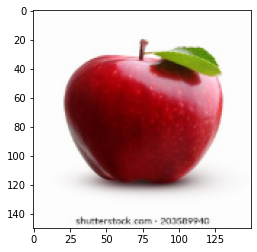

(512, 680, 3)
Predicted Output : RED_APPLE


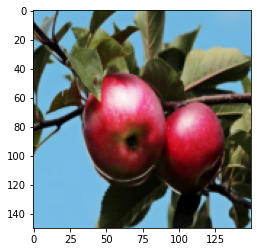

(684, 609, 3)
Predicted Output : RED_APPLE


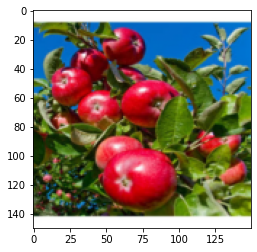

(144, 349, 3)
Predicted Output : BANANA


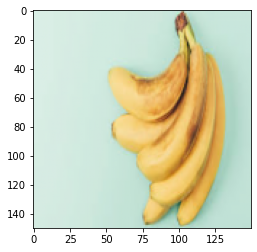

(640, 960, 3)
Predicted Output : BANANA


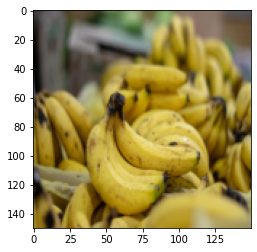

(168, 300, 3)
Predicted Output : BANANA


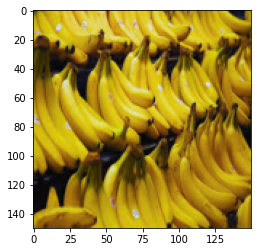

(420, 612, 3)
Predicted Output : GRAPES


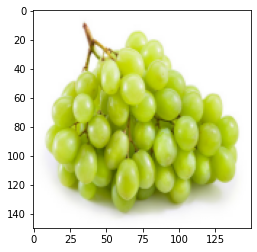

(900, 1200, 3)
Predicted Output : GRAPES


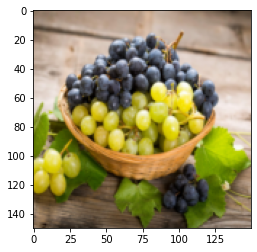

(194, 259, 3)
Predicted Output : GRAPES


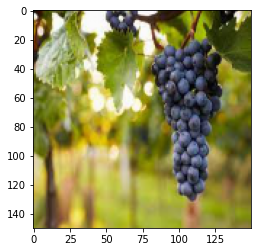

(1200, 1200, 3)
Predicted Output : GRAPES


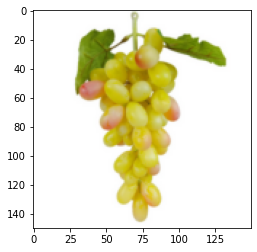

(225, 225, 3)
Predicted Output : GRAPES


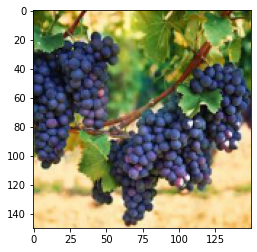

(275, 183, 3)
Predicted Output : GRAPES


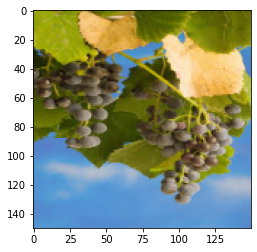

(221, 387, 3)
Predicted Output : BANANA


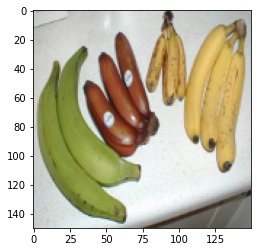

(512, 1024, 3)
Predicted Output : BANANA


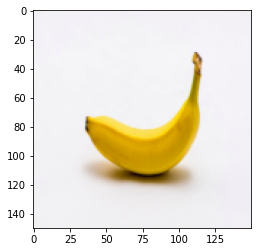

time: 4.35 s (started: 2021-06-28 14:59:38 +00:00)


In [16]:
Test_dir = '/content/drive/MyDrive/Testing_images'

for im in os.listdir(Test_dir):
  flat_data = []
  img = imread(os.path.join(Test_dir,im))

  #resizing the images-> flatten->store
  img_resized = resize(img,(150,150,3))
  flat_data.append(img_resized.flatten())
  print(img.shape)
  y_out = grid.predict(flat_data)
  y_out = CATEGORIES[y_out[0]]
  print(f'Predicted Output : {y_out}')
  plt.imshow(img_resized)
  plt.show()
  


